# Task 3: Contrastive Models – Analyzing CLIP (ViT-B/32) and Multimodal Biases


## Setup

In [4]:
import torch
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader
from transformers import CLIPProcessor, CLIPModel
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import random
from PIL import Image
import os
from collections import defaultdict

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [6]:
# Load CLIP model
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
model.eval()
print("CLIP ViT-B/32 model loaded successfully")

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

CLIP ViT-B/32 model loaded successfully


## 1. Zero-Shot + Few-shot Classification on CIFAR-10

In [7]:
# Load STL-10 test set
transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize((0.5,), (0.5,))
])

stl10_test = torchvision.datasets.STL10(root="./data", split="test", download=True, transform=transform)
test_loader = DataLoader(stl10_test, batch_size=64, shuffle=False)

stl10_classes = stl10_test.classes

# Different prompt strategies
prompts_strategies = {
    "plain": stl10_classes,
    "photo": [f"a photo of a {cls}" for cls in stl10_classes],
    "detailed": [f"an amazing, colourful clean textured and shape appropiate photo of a {cls}, {cls}." for cls in stl10_classes]
}

def zero_shot_classification_detailed(prompts_dict):
    """Evaluate CLIP zero-shot performance with detailed analysis"""
    results = {}

    for strategy_name, candidate_labels in prompts_dict.items():
        print(f"\n{'='*50}")
        print(f"EVALUATING: {strategy_name.upper()} PROMPTS")
        print(f"{'='*50}")
        print("Prompts used:", candidate_labels[:3], "...")

        # Encode text prompts
        text_inputs = processor(text=candidate_labels, return_tensors="pt", padding=True).to(device)
        with torch.no_grad():
            text_embeddings = model.get_text_features(**text_inputs)
        text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

        # Track per-class performance
        class_correct = defaultdict(int)
        class_total = defaultdict(int)
        confusion_matrix = np.zeros((10, 10))
        all_predictions = []
        all_labels = []

        correct_predictions = 0
        total_samples = 0

        for batch_idx, (images, labels) in enumerate(test_loader):
            images = images.to(device)
            labels = labels.to(device)

            # Get image embeddings
            with torch.no_grad():
                image_embeddings = model.get_image_features(images)
            image_embeddings = image_embeddings / image_embeddings.norm(dim=-1, keepdim=True)

            # Compute cosine similarities
            similarities = image_embeddings @ text_embeddings.T
            predictions = similarities.argmax(dim=1)

            # Track statistics
            batch_correct = (predictions == labels).sum().item()
            correct_predictions += batch_correct
            total_samples += labels.size(0)

            # Per-class tracking
            for pred, true_label in zip(predictions, labels):
                pred_item, true_item = pred.item(), true_label.item()
                all_predictions.append(pred_item)
                all_labels.append(true_item)
                class_total[true_item] += 1
                if pred_item == true_item:
                    class_correct[true_item] += 1
                confusion_matrix[true_item, pred_item] += 1

            if batch_idx % 50 == 0:
                batch_acc = batch_correct / labels.size(0)
                print(f"Batch {batch_idx}: accuracy = {batch_acc*100:.1f}%")

        # Calculate final accuracy
        accuracy = correct_predictions / total_samples
        results[strategy_name] = accuracy

        print(f"\nOVERALL ACCURACY: {accuracy*100:.2f}% ({correct_predictions}/{total_samples})")

        # Per-class performance analysis
        print(f"\nPER-CLASS PERFORMANCE:")
        print(f"{'Class':<12} {'Accuracy':<10} {'Correct':<8} {'Total':<8} {'Common Mistakes'}")
        print(f"-" * 70)

        worst_classes = []
        best_classes = []

        for class_idx in range(10):
            if class_total[class_idx] > 0:
                class_acc = class_correct[class_idx] / class_total[class_idx]

                # Find most common mistakes for this class
                class_confusions = confusion_matrix[class_idx]
                class_confusions[class_idx] = 0  # Remove correct predictions
                top_mistake_idx = np.argmax(class_confusions)
                mistake_count = int(class_confusions[top_mistake_idx])

                mistake_str = f"{stl10_classes[top_mistake_idx]}({mistake_count})" if mistake_count > 0 else "None"

                print(f"{stl10_classes[class_idx]:<12} {class_acc*100:<10.1f} {class_correct[class_idx]:<8} {class_total[class_idx]:<8} {mistake_str}")

                if class_acc < 0.7:
                    worst_classes.append((stl10_classes[class_idx], class_acc))
                if class_acc > 0.9:
                    best_classes.append((stl10_classes[class_idx], class_acc))

        # Summary of challenging classes
        if worst_classes:
            print(f"\nWORST PERFORMING CLASSES:")
            for class_name, acc in worst_classes:
                print(f"  - {class_name}: {acc*100:.1f}%")

        if best_classes:
            print(f"\nBEST PERFORMING CLASSES:")
            for class_name, acc in best_classes:
                print(f"  - {class_name}: {acc*100:.1f}%")

        # Most confused pairs
        print(f"\nMOST CONFUSED CLASS PAIRS:")
        confusion_pairs = []
        for i in range(10):
            for j in range(10):
                if i != j and confusion_matrix[i,j] > 5:  # At least 5 confusions
                    confusion_pairs.append((stl10_classes[i], stl10_classes[j], int(confusion_matrix[i,j])))

        confusion_pairs.sort(key=lambda x: x[2], reverse=True)
        for true_cls, pred_cls, count in confusion_pairs[:5]:
            print(f"  - {true_cls} → {pred_cls}: {count} times")

    return results

100%|██████████| 2.64G/2.64G [00:50<00:00, 52.6MB/s]


In [8]:
# Run detailed zero-shot evaluation
print("Starting Zero-Shot Classification Analysis...")
zero_shot_results = zero_shot_classification_detailed(prompts_strategies)

Starting Zero-Shot Classification Analysis...

EVALUATING: PLAIN PROMPTS
Prompts used: ['airplane', 'bird', 'car'] ...
Batch 0: accuracy = 95.3%
Batch 50: accuracy = 93.8%
Batch 100: accuracy = 92.2%

OVERALL ACCURACY: 95.83% (7666/8000)

PER-CLASS PERFORMANCE:
Class        Accuracy   Correct  Total    Common Mistakes
----------------------------------------------------------------------
airplane     93.4       747      800      ship(33)
bird         99.5       796      800      dog(2)
car          95.2       762      800      truck(38)
cat          87.8       702      800      deer(52)
deer         97.0       776      800      horse(13)
dog          96.9       775      800      cat(13)
horse        98.0       784      800      deer(7)
monkey       91.8       734      800      bird(30)
ship         99.9       799      800      horse(1)
truck        98.9       791      800      car(9)

BEST PERFORMING CLASSES:
  - airplane: 93.4%
  - bird: 99.5%
  - car: 95.2%
  - deer: 97.0%
  - dog: 9

In [9]:
# Compare prompt strategies
print(f"\n{'='*60}")
print("PROMPT STRATEGY COMPARISON")
print(f"{'='*60}")
for strategy, acc in zero_shot_results.items():
    print(f"{strategy.upper()} prompts: {acc*100:.2f}%")


PROMPT STRATEGY COMPARISON
PLAIN prompts: 95.83%
PHOTO prompts: 96.79%
DETAILED prompts: 96.43%


## 2. Domain-Shifted Classification (Sketches)

In [10]:
def test_domain_generalization_pacs(model, processor, device, pacs_dataset):
    """
    Test CLIP on PACS dataset for domain generalization using Hugging Face datasets (flwrlabs/pacs).
    """
    print(f"\n{'='*60}")
    print("PACS DOMAIN GENERALIZATION ANALYSIS")
    print(f"{'='*60}")

    # PACS classes + domains
    pacs_classes = ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']
    pacs_domains = ['photo', 'art_painting', 'cartoon', 'sketch']

    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize((0.5,), (0.5))
    ])

    # Prompt strategies
    prompt_types = {
        "generic": [f"a {cls}" for cls in pacs_classes],
        "photo": [f"a photo of a {cls}" for cls in pacs_classes],
        "artwork": [f"artwork of a {cls}" for cls in pacs_classes],
        "painting": [f"a painting of a {cls}" for cls in pacs_classes],
        "cartoon": [f"a cartoon of a {cls}" for cls in pacs_classes],
        "sketch": [f"a sketch of a {cls}" for cls in pacs_classes],
        "drawing": [f"a drawing of a {cls}" for cls in pacs_classes]
    }

    results = {}

    # Only "train" split exists
    dataset = pacs_dataset["train"]

    for domain in pacs_domains:
        print(f"\n--- TESTING {domain.upper()} DOMAIN ---")

        # Filter domain samples
        domain_samples = dataset.filter(lambda x: x["domain"] == domain)

        if len(domain_samples) == 0:
            print(f"No samples found for {domain}")
            continue

        # Subsample for speed
        max_samples = min(200, len(domain_samples))
        indices = np.random.choice(len(domain_samples), max_samples, replace=False)

        images, labels = [], []
        for idx in indices:
            # ex = domain_samples[idx]
            ex = domain_samples[int(idx)]
            img = transform(ex["image"].convert("RGB"))
            images.append(img)
            labels.append(int(ex["label"]))

        domain_batch = torch.stack(images).to(device)
        labels = np.array(labels)

        # Test prompt types
        for prompt_name, prompts in prompt_types.items():
            text_inputs = processor(text=prompts, return_tensors="pt", padding=True).to(device)

            with torch.no_grad():
                text_embeddings = model.get_text_features(**text_inputs)
                image_embeddings = model.get_image_features(domain_batch)

            # Normalize
            text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)
            image_embeddings = image_embeddings / image_embeddings.norm(dim=-1, keepdim=True)

            similarities = image_embeddings @ text_embeddings.T
            predictions = similarities.argmax(dim=1).cpu().numpy()

            accuracy = (predictions == labels).mean()
            results[f"{domain}_{prompt_name}"] = accuracy

            print(f"  {prompt_name:10s}: {accuracy*100:5.1f}%")

    # Best prompts per domain
    print(f"\n{'='*50}")
    print("OPTIMAL PROMPTS BY DOMAIN")
    print(f"{'='*50}")

    for domain in pacs_domains:
        domain_results = {k.split('_')[1]: v for k, v in results.items()
                         if k.startswith(domain)}
        if domain_results:
            best = max(domain_results.items(), key=lambda x: x[1])
            print(f"{domain:12s}: '{best[0]}' prompts ({best[1]*100:.1f}%)")

    return results

In [11]:
# Load PACS dataset
from datasets import load_dataset
pacs_dataset = load_dataset("flwrlabs/pacs")
print(pacs_dataset)

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/191M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9991 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'domain', 'label'],
        num_rows: 9991
    })
})


In [12]:
domain_results = test_domain_generalization_pacs(model, processor, device, pacs_dataset)


PACS DOMAIN GENERALIZATION ANALYSIS

--- TESTING PHOTO DOMAIN ---


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

  generic   : 100.0%
  photo     : 100.0%
  artwork   : 100.0%
  painting  : 100.0%
  cartoon   : 100.0%
  sketch    : 100.0%
  drawing   : 100.0%

--- TESTING ART_PAINTING DOMAIN ---


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

  generic   :  95.0%
  photo     :  96.0%
  artwork   :  95.0%
  painting  :  95.0%
  cartoon   :  94.0%
  sketch    :  94.5%
  drawing   :  94.5%

--- TESTING CARTOON DOMAIN ---


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

  generic   :  95.5%
  photo     :  96.0%
  artwork   :  97.5%
  painting  :  96.0%
  cartoon   :  96.0%
  sketch    :  96.5%
  drawing   :  96.0%

--- TESTING SKETCH DOMAIN ---


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

  generic   :  86.5%
  photo     :  86.0%
  artwork   :  88.5%
  painting  :  88.0%
  cartoon   :  87.0%
  sketch    :  87.0%
  drawing   :  87.0%

OPTIMAL PROMPTS BY DOMAIN
photo       : 'generic' prompts (100.0%)
art_painting: 'painting' prompts (94.5%)
cartoon     : 'artwork' prompts (97.5%)
sketch      : 'artwork' prompts (88.5%)


In [13]:
import matplotlib.pyplot as plt
import textwrap

def visualize_pacs_results(pacs_dataset, num_examples=2, wrap_width=25):
    pacs_classes = ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']
    pacs_domains = ['photo', 'art_painting', 'cartoon', 'sketch']
    prompt_types = {
        "photo": [f"a photo of a {cls}" for cls in pacs_classes],
        "cartoon": [f"a cartoon of a {cls}" for cls in pacs_classes],
        "sketch": [f"a sketch of a {cls}" for cls in pacs_classes],
        "generic": [f"a {cls}" for cls in pacs_classes],
    }

    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize((0.5,), (0.5))
    ])

    dataset = pacs_dataset["train"]

    # pick random classes
    chosen_classes = np.random.choice(pacs_classes, num_examples, replace=False)

    for cls in chosen_classes:
        cls_idx = pacs_classes.index(cls)
        print(f"\n=== CLASS: {cls.upper()} ===")

        fig, axes = plt.subplots(len(pacs_domains), len(prompt_types), figsize=(4*len(prompt_types), 4*len(pacs_domains)))

        for d_idx, domain in enumerate(pacs_domains):
            # Filter this domain + class
            domain_samples = dataset.filter(lambda x: x["domain"] == domain and int(x["label"]) == cls_idx)
            if len(domain_samples) == 0:
                continue

            # Pick one random example
            ex = domain_samples[np.random.randint(len(domain_samples))]
            img = transform(ex["image"].convert("RGB")).unsqueeze(0).to(device)
            true_class = pacs_classes[int(ex["label"])]

            # Loop over prompt strategies
            for p_idx, (prompt_name, prompts) in enumerate(prompt_types.items()):
                text_inputs = processor(text=prompts, return_tensors="pt", padding=True).to(device)

                with torch.no_grad():
                    text_emb = model.get_text_features(**text_inputs)
                    img_emb = model.get_image_features(img)

                text_emb = text_emb / text_emb.norm(dim=-1, keepdim=True)
                img_emb = img_emb / img_emb.norm(dim=-1, keepdim=True)

                sims = img_emb @ text_emb.T
                pred_idx = sims.argmax(dim=1).item()
                pred_class = pacs_classes[pred_idx]

                # Display image
                ax = axes[d_idx, p_idx] if len(chosen_classes) > 1 else axes[d_idx][p_idx]
                ax.imshow(ex["image"])
                ax.axis("off")

                # Title with wrapping
                wrapped_prompt = "\n".join(textwrap.wrap(prompts[cls_idx], width=wrap_width))
                ax.set_title(
                    f"{domain}\nPrompt: {prompt_name}\n"
                    f"Expected: {true_class}\nGot: {pred_class} {'✅' if pred_class==true_class else '❌'}",
                    fontsize=8
                )

        plt.suptitle(f"PACS Domain Generalization: {cls}", fontsize=14, y=1.02)
        plt.tight_layout()
        plt.show()


=== CLASS: GIRAFFE ===


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

/tmp/ipython-input-2726660273.py:71: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2726660273.py:71: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


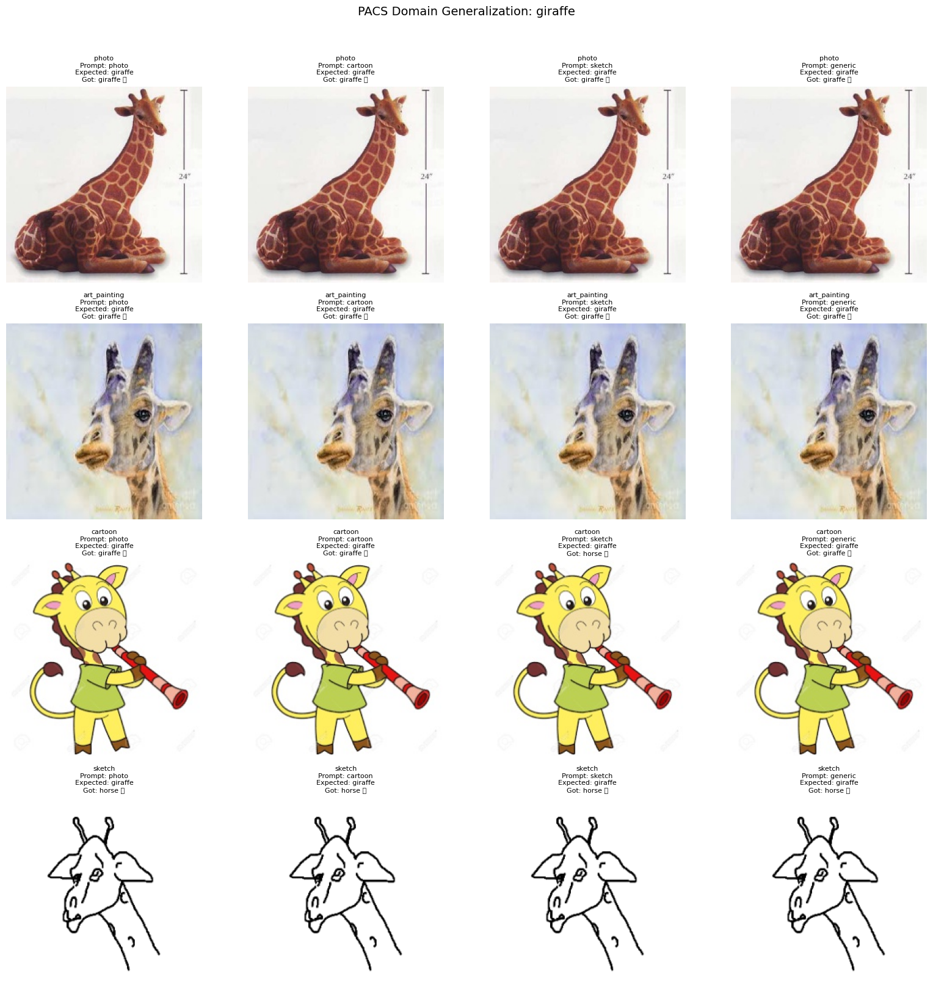


=== CLASS: HORSE ===


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

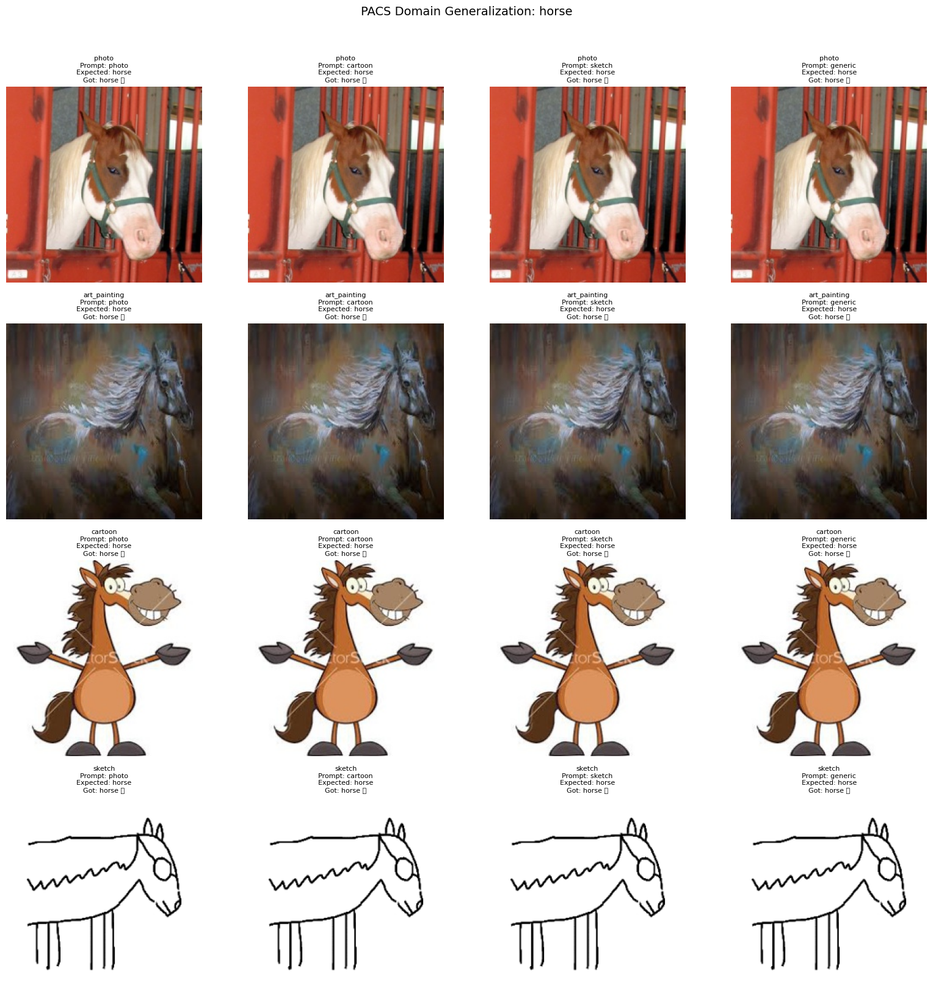

In [14]:
visualize_pacs = visualize_pacs_results(pacs_dataset)

## 3. Image-Text Retrieval Analysis

In [15]:
def retrieval_analysis():
    print(f"\n{'='*60}")
    print("FIXED IMAGE-TEXT RETRIEVAL ANALYSIS")
    print(f"{'='*60}")

    # Create diverse test set - 5 images from each class
    retrieval_images = []
    retrieval_labels = []
    image_indices = []

    samples_per_class = 50
    for class_idx in range(10):
        class_count = 0
        for idx, (img, label) in enumerate(stl10_test):
            if label == class_idx and class_count < samples_per_class:
                retrieval_images.append(img)
                retrieval_labels.append(label)
                image_indices.append(idx)
                class_count += 1
            if class_count >= samples_per_class:
                break

    # Shuffle retrieval set for more diverse analysis
    combined = list(zip(retrieval_images, retrieval_labels, image_indices))
    random.shuffle(combined)
    retrieval_images, retrieval_labels, image_indices = zip(*combined)
    retrieval_images, retrieval_labels, image_indices = list(retrieval_images), list(retrieval_labels), list(image_indices)

    print(f"Created retrieval dataset: {len(retrieval_images)} images ({samples_per_class} per class)")

    # FIXED: Create properly aligned text queries
    text_queries = {
        "basic": [f"a {cls}" for cls in stl10_classes],
        "descriptive": [f"a photo of a {cls}" for cls in stl10_classes],
        "detailed": [
            "a commercial airplane flying in the sky",        # airplane
            "a colorful bird perched on a branch",            # bird
            "a red car driving on the road",                  # car
            "a cute cat sitting indoors",                     # cat
            "a deer grazing in a forest",                     # deer
            "a friendly dog playing outside",                 # dog
            "a brown horse galloping in a field",             # horse
            "a monkey swinging in trees",                     # monkey
            "a large ship sailing on the ocean",              # ship
            "a heavy truck carrying cargo"                    # truck
        ]
    }

    # Verify alignment
    print("\nQuery-Class Alignment Check:")
    for i, (basic, detailed) in enumerate(zip(text_queries["basic"], text_queries["detailed"])):
        print(f"  {stl10_classes[i]}: '{basic}' → '{detailed}'")

    batch_images = torch.stack(retrieval_images).to(device)

    # Get image embeddings once
    with torch.no_grad():
        image_embeddings = model.get_image_features(batch_images)
    image_embeddings = image_embeddings / image_embeddings.norm(dim=-1, keepdim=True)

    retrieval_results = {}

    for query_type, queries in text_queries.items():
        print(f"\n--- {query_type.upper()} QUERIES ---")

        # Get text embeddings
        text_inputs = processor(text=queries, return_tensors="pt", padding=True).to(device)
        with torch.no_grad():
            text_embeddings = model.get_text_features(**text_inputs)
        text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

        # Compute similarities [num_images x num_queries]
        similarities = image_embeddings @ text_embeddings.T

        # Text-to-Image Retrieval (for each query, find best image)
        print(f"\nText-to-Image Retrieval:")
        t2i_hits = 0
        t2i_examples = []  # Store examples for visualization

        for query_idx, query in enumerate(queries):
            best_img_idx = similarities[:, query_idx].argmax().item()
            best_score = similarities[best_img_idx, query_idx].item()

            retrieved_class = stl10_classes[retrieval_labels[best_img_idx]]
            expected_class = stl10_classes[query_idx]  # Fixed: direct alignment

            is_correct = retrieved_class == expected_class
            if is_correct:
                t2i_hits += 1

            # Store example for visualization
            t2i_examples.append({
                'query': query,
                'query_idx': query_idx,
                'expected_class': expected_class,
                'retrieved_class': retrieved_class,
                'image': retrieval_images[best_img_idx],
                'score': best_score,
                'correct': is_correct,
                'image_idx': best_img_idx
            })

            print(f"  '{query}' → {retrieved_class} (score: {best_score:.3f}) {'✓' if is_correct else '✗'}")

        t2i_accuracy = t2i_hits / len(queries)
        print(f"  Text-to-Image Accuracy: {t2i_accuracy*100:.1f}% ({t2i_hits}/{len(queries)})")

        # Image-to-Text Retrieval (for each image, find best query)
        print(f"\nImage-to-Text Retrieval (first 10 images):")
        i2t_hits = 0
        i2t_examples = []
        total_images_checked = min(10, len(retrieval_images))

        for img_idx in range(total_images_checked):
            best_query_idx = similarities[img_idx, :].argmax().item()
            best_score = similarities[img_idx, best_query_idx].item()

            true_class = stl10_classes[retrieval_labels[img_idx]]
            retrieved_query = queries[best_query_idx]
            expected_class_in_query = stl10_classes[best_query_idx]  # Fixed

            is_correct = true_class == expected_class_in_query
            if is_correct:
                i2t_hits += 1

            # Store example for visualization
            i2t_examples.append({
                'true_class': true_class,
                'retrieved_query': retrieved_query,
                'expected_class': expected_class_in_query,
                'image': retrieval_images[img_idx],
                'score': best_score,
                'correct': is_correct
            })

            print(f"  {true_class} image → '{retrieved_query}' (score: {best_score:.3f}) {'✓' if is_correct else '✗'}")

        i2t_accuracy = i2t_hits / total_images_checked
        print(f"  Image-to-Text Accuracy: {i2t_accuracy*100:.1f}% ({i2t_hits}/{total_images_checked})")

        # Store results with examples
        retrieval_results[query_type] = {
            "t2i_accuracy": t2i_accuracy,
            "i2t_accuracy": i2t_accuracy,
            "avg_accuracy": (t2i_accuracy + i2t_accuracy) / 2,
            "t2i_examples": t2i_examples,
            "i2t_examples": i2t_examples
        }

    # Cross-modal retrieval summary
    print(f"\n{'='*50}")
    print("RETRIEVAL PERFORMANCE SUMMARY")
    print(f"{'='*50}")

    for query_type, results in retrieval_results.items():
        print(f"{query_type.upper()}:")
        print(f"  Text→Image: {results['t2i_accuracy']*100:.1f}%")
        print(f"  Image→Text: {results['i2t_accuracy']*100:.1f}%")
        print(f"  Average: {results['avg_accuracy']*100:.1f}%")

    # Find best performing query type
    best_query_type = max(retrieval_results.keys(), key=lambda k: retrieval_results[k]['avg_accuracy'])
    best_avg = retrieval_results[best_query_type]['avg_accuracy']
    print(f"\nBest query type: {best_query_type} (avg: {best_avg*100:.1f}%)")

    return retrieval_results

In [16]:
results = retrieval_analysis()


FIXED IMAGE-TEXT RETRIEVAL ANALYSIS
Created retrieval dataset: 500 images (50 per class)

Query-Class Alignment Check:
  airplane: 'a airplane' → 'a commercial airplane flying in the sky'
  bird: 'a bird' → 'a colorful bird perched on a branch'
  car: 'a car' → 'a red car driving on the road'
  cat: 'a cat' → 'a cute cat sitting indoors'
  deer: 'a deer' → 'a deer grazing in a forest'
  dog: 'a dog' → 'a friendly dog playing outside'
  horse: 'a horse' → 'a brown horse galloping in a field'
  monkey: 'a monkey' → 'a monkey swinging in trees'
  ship: 'a ship' → 'a large ship sailing on the ocean'
  truck: 'a truck' → 'a heavy truck carrying cargo'

--- BASIC QUERIES ---

Text-to-Image Retrieval:
  'a airplane' → airplane (score: 0.292) ✓
  'a bird' → bird (score: 0.298) ✓
  'a car' → car (score: 0.295) ✓
  'a cat' → cat (score: 0.282) ✓
  'a deer' → deer (score: 0.308) ✓
  'a dog' → dog (score: 0.282) ✓
  'a horse' → horse (score: 0.304) ✓
  'a monkey' → monkey (score: 0.314) ✓
  'a sh

In [17]:
import matplotlib.pyplot as plt
import textwrap

def visualize_retrieval_results(retrieval_results, num_examples=5, wrap_width=25):
    """
    Fancy visualization for retrieval analysis results.
    - Enlarged figures for long queries
    - Wraps query text so descriptive prompts are readable
    """
    to_pil = T.ToPILImage()

    # -------------------------------
    # Text → Image Retrieval
    # -------------------------------
    for query_type, results in retrieval_results.items():
        print(f"\n=== {query_type.upper()} QUERIES: Text → Image Examples ===")

        examples = results["t2i_examples"][:num_examples]
        fig, axes = plt.subplots(1, num_examples, figsize=(5*num_examples, 5))

        if num_examples == 1:
            axes = [axes]  # ensure iterable

        for i, ex in enumerate(examples):
            img = to_pil(ex['image'].cpu())
            axes[i].imshow(img)
            axes[i].axis("off")

            # Wrap query text if long
            wrapped_query = "\n".join(textwrap.wrap(ex['query'], width=wrap_width))

            axes[i].set_title(
                f"Query:\n{wrapped_query}\n\n"
                f"Expected: {ex['expected_class']}\n"
                f"Got: {ex['retrieved_class']}\n"
                f"{'✅' if ex['correct'] else '❌'}",
                fontsize=9
            )

        plt.suptitle(f"Text-to-Image Retrieval ({query_type})", fontsize=12, y=1.05)
        plt.tight_layout()
        plt.show()

    # -------------------------------
    # Image → Text Retrieval
    # -------------------------------
    for query_type, results in retrieval_results.items():
        print(f"\n=== {query_type.upper()} QUERIES: Image → Text Examples ===")

        examples = results["i2t_examples"][:num_examples]
        fig, axes = plt.subplots(1, num_examples, figsize=(5*num_examples, 5))

        if num_examples == 1:
            axes = [axes]

        for i, ex in enumerate(examples):
            img = to_pil(ex['image'].cpu())
            axes[i].imshow(img)
            axes[i].axis("off")

            # Wrap query text if long
            wrapped_query = "\n".join(textwrap.wrap(ex['retrieved_query'], width=wrap_width))

            axes[i].set_title(
                f"True: {ex['true_class']}\n"
                f"Retrieved:\n{wrapped_query}\n\n"
                f"Expected Class: {ex['expected_class']}\n"
                f"{'✅' if ex['correct'] else '❌'}",
                fontsize=9
            )

        plt.suptitle(f"Image-to-Text Retrieval ({query_type})", fontsize=12, y=1.05)
        plt.tight_layout()
        plt.show()



=== BASIC QUERIES: Text → Image Examples ===


/tmp/ipython-input-3927366533.py:41: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


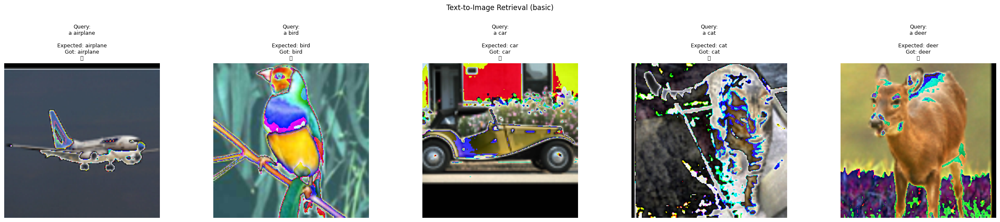


=== DESCRIPTIVE QUERIES: Text → Image Examples ===


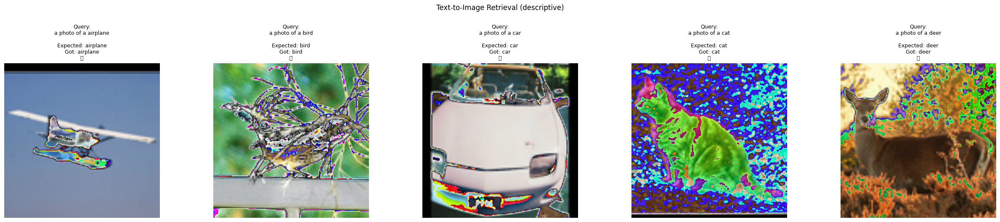


=== DETAILED QUERIES: Text → Image Examples ===


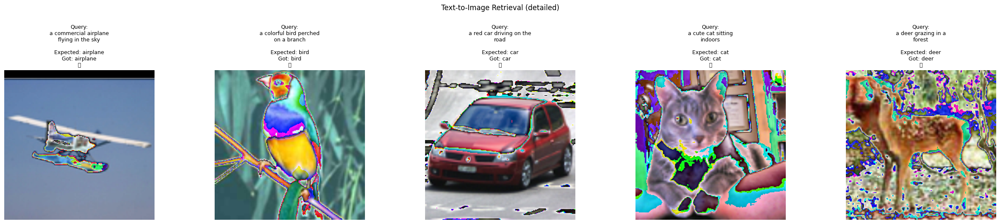


=== BASIC QUERIES: Image → Text Examples ===


/tmp/ipython-input-3927366533.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


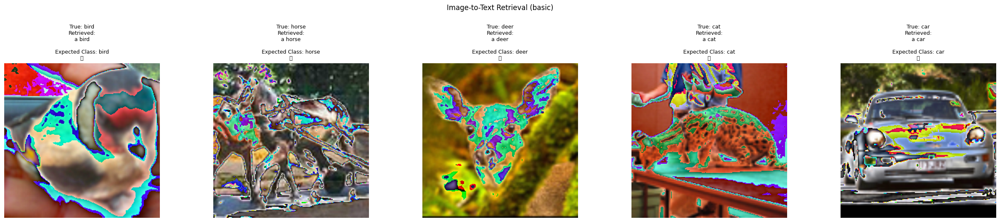


=== DESCRIPTIVE QUERIES: Image → Text Examples ===


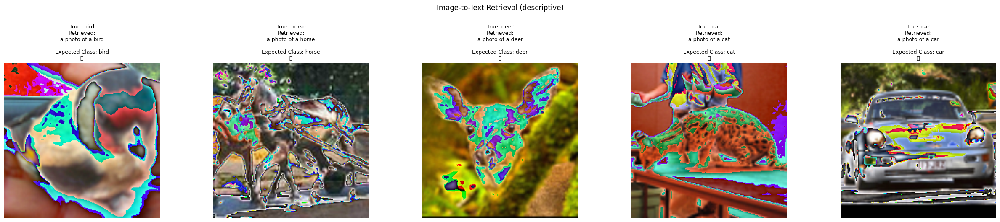


=== DETAILED QUERIES: Image → Text Examples ===


/tmp/ipython-input-3927366533.py:73: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


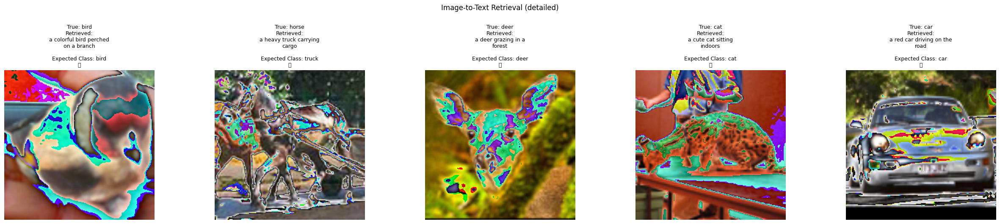

In [18]:
visualize = visualize_retrieval_results(results)

## 4. Representation Analysis - CLIP vs Supervised Model

In [24]:
from torchvision.models import resnet50
import torch.nn as nn

def load_finetuned_resnet(weights_path, device):
    model = resnet50(weights=None)  # bare ResNet arch

    # Replace fc with 10-class head to match checkpoint
    model.fc = nn.Linear(model.fc.in_features, 10)

    # Load your fine-tuned weights
    state_dict = torch.load(weights_path, map_location=device)
    model.load_state_dict(state_dict)

    model = model.to(device)
    model.eval()

    # Feature extractor: remove final FC
    feature_extractor = nn.Sequential(*list(model.children())[:-1])
    return model, feature_extractor


def analyze_representation_spaces(pacs_dataset, finetuned_resnet_path):
    """Compare CLIP vs finetuned ResNet representations - using PACS sketch domain instead of synthetic filter"""

    print(f"\n{'='*60}")
    print("REPRESENTATION SPACE ANALYSIS")
    print(f"{'='*60}")

    supervised_model, supervised_feature_extractor = load_finetuned_resnet(finetuned_resnet_path, device)

    # STL10 + PACS class names
    stl10_classes = ['airplane', 'bird', 'car', 'cat', 'deer','dog', 'horse', 'monkey', 'ship', 'truck']
    pacs_classes = ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

    # PACS → STL10 mapping (only overlapping concepts)
    class_mapping = {
        "dog": "dog",
        "horse": "horse",
        "person": "monkey"  # best match since STL10 has no "person"
    }

    # 1. Collect STL10 base images (only for mapped classes)
    num_per_class = 80
    base_images = []

    # Get indices of mapped STL10 classes
    mapped_stl10_indices = {cls: stl10_classes.index(mapped_cls) for cls, mapped_cls in class_mapping.items()}

    class_counts = {idx: 0 for idx in mapped_stl10_indices.values()}

    for idx, (img, label) in enumerate(stl10_test):
        if label in class_counts and class_counts[label] < num_per_class:
            base_images.append((img, label, idx))
            class_counts[label] += 1
        if sum(class_counts.values()) >= len(class_counts) * num_per_class:
            break

    # 2. Collect PACS sketch images (only mapped classes)
    sketch_split = pacs_dataset["train"].filter(lambda x: x["domain"] == "sketch")

    pacs_sketch_images = []
    pacs_counts = {cls: 0 for cls in class_mapping.keys()}

    for ex in sketch_split:
        pacs_label = int(ex["label"])
        pacs_class = pacs_classes[pacs_label]

        if pacs_class in class_mapping and pacs_counts[pacs_class] < num_per_class:
            img = T.Resize((224, 224))(ex["image"].convert("RGB"))
            img = T.ToTensor()(img)
            pacs_sketch_images.append((img, pacs_class))
            pacs_counts[pacs_class] += 1
        if sum(pacs_counts.values()) >= len(pacs_counts) * num_per_class:
            break

    # 3. Build dataset: original, grayscale, high_contrast, sketch(PACS)
    domain_transforms = {
        'original': lambda x: x,
        'grayscale': lambda x: T.Grayscale(num_output_channels=3)(x),
        'high_contrast': lambda x: T.functional.adjust_contrast(x, 2.5)
    }

    mixed_data = []

    # STL10 variants
    for img, label, orig_idx in base_images:
        for domain_name, transform in domain_transforms.items():
            transformed_img = transform(img)
            if transformed_img.shape[0] == 1:
                transformed_img = transformed_img.repeat(3, 1, 1)
            mixed_data.append({
                'image': transformed_img,
                'label': label,
                'class_name': stl10_classes[label],
                'domain': domain_name,
                'original_idx': orig_idx
            })

    # PACS sketch variants (align by mapped class)
    for (pacs_img, pacs_class) in pacs_sketch_images:
        stl10_class = class_mapping[pacs_class]
        stl10_label = stl10_classes.index(stl10_class)

        # find one STL10 base image with this label
        candidate = next((b for b in base_images if b[1] == stl10_label), None)
        if candidate:
            _, _, orig_idx = candidate
            if pacs_img.shape[0] == 1:
                pacs_img = pacs_img.repeat(3, 1, 1)
            mixed_data.append({
                'image': pacs_img,
                'label': stl10_label,
                'class_name': stl10_class,
                'domain': 'sketch',
                'original_idx': orig_idx
            })

    print(f"Created {len(mixed_data)} samples: "f"{len(base_images)} base × {len(domain_transforms)+1} domains")

    # ---------------------------
    # Embedding extraction
    # ---------------------------
    all_images = torch.stack([item['image'] for item in mixed_data]).to(device)
    all_labels = [item['label'] for item in mixed_data]
    all_domains = [item['domain'] for item in mixed_data]

    print("Extracting CLIP embeddings...")
    with torch.no_grad():
        clip_embeddings = model.get_image_features(all_images)
    clip_embeddings = clip_embeddings / clip_embeddings.norm(dim=-1, keepdim=True)
    clip_embeddings = clip_embeddings.cpu().numpy()

    print("Extracting ResNet embeddings...")
    with torch.no_grad():
        supervised_embeddings = supervised_feature_extractor(all_images)
        supervised_embeddings = supervised_embeddings.flatten(1)
    supervised_embeddings = supervised_embeddings / torch.norm(supervised_embeddings, dim=1, keepdim=True)
    supervised_embeddings = supervised_embeddings.cpu().numpy()

    # ---------------------------
    # t-SNE projection & plots
    # ---------------------------
    from sklearn.manifold import TSNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=20)
    clip_2d = tsne.fit_transform(clip_embeddings)

    tsne2 = TSNE(n_components=2, random_state=42, perplexity=20)
    supervised_2d = tsne2.fit_transform(supervised_embeddings)

    def plot_comparison(clip_2d, supervised_2d, labels, domains):
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        colors = plt.cm.tab10(np.linspace(0, 1, 10))

        # CLIP by class
        ax = axes[0, 0]
        for class_idx in range(10):
            mask = [l == class_idx for l in labels]
            if any(mask):
                class_points = clip_2d[mask]
                ax.scatter(class_points[:, 0], class_points[:, 1],
                           c=[colors[class_idx]], label=stl10_classes[class_idx],
                           alpha=0.7, s=30)
        ax.set_title("CLIP - Colored by Class")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

        # CLIP by domain
        ax = axes[0, 1]
        domain_colors = {'original': 'blue', 'grayscale': 'red', 'high_contrast': 'green', 'sketch': 'orange'}
        for domain in domain_colors.keys():
            mask = [d == domain for d in domains]
            if any(mask):
                domain_points = clip_2d[mask]
                ax.scatter(domain_points[:, 0], domain_points[:, 1],
                           c=domain_colors[domain], label=domain, alpha=0.7, s=30)
        ax.set_title("CLIP - Colored by Domain")
        ax.legend()

        # ResNet by class
        ax = axes[1, 0]
        for class_idx in range(10):
            mask = [l == class_idx for l in labels]
            if any(mask):
                class_points = supervised_2d[mask]
                ax.scatter(class_points[:, 0], class_points[:, 1],
                           c=[colors[class_idx]], label=stl10_classes[class_idx],
                           alpha=0.7, s=30)
        ax.set_title("ResNet - Colored by Class")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

        # ResNet by domain
        ax = axes[1, 1]
        for domain in domain_colors.keys():
            mask = [d == domain for d in domains]
            if any(mask):
                domain_points = supervised_2d[mask]
                ax.scatter(domain_points[:, 0], domain_points[:, 1],
                           c=domain_colors[domain], label=domain, alpha=0.7, s=30)
        ax.set_title("ResNet - Colored by Domain")
        ax.legend()

        plt.tight_layout()
        plt.show()

    plot_comparison(clip_2d, supervised_2d, all_labels, all_domains)


REPRESENTATION SPACE ANALYSIS


Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Created 960 samples: 240 base × 4 domains
Extracting CLIP embeddings...
Extracting ResNet embeddings...


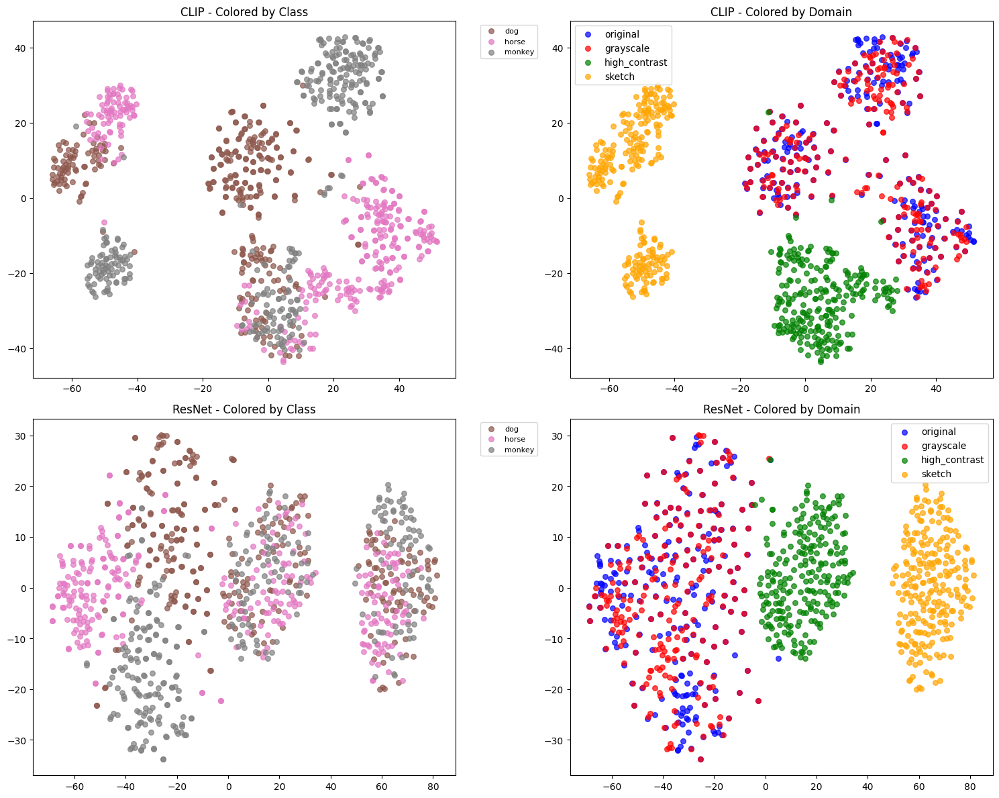

In [25]:
representation_analysis = analyze_representation_spaces(pacs_dataset, "/content/resnet50_weights.pth")

## 5. Shape vs Texture Bias Analysis

In [29]:
!git clone https://github.com/rgeirhos/texture-vs-shape

Cloning into 'texture-vs-shape'...
remote: Enumerating objects: 2375, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 2375 (delta 31), reused 154 (delta 28), pack-reused 2210 (from 1)
Receiving objects: 100% (2375/2375), 148.67 MiB | 31.16 MiB/s, done.
Resolving deltas: 100% (257/257), done.


In [70]:
import os
from PIL import Image

def clean_label(label_with_num: str) -> str:
    """Convert 'cat9' -> 'cat', 'dog1' -> 'dog', etc."""
    return ''.join([ch for ch in label_with_num if not ch.isdigit()])

def load_cue_conflict_stimuli(root_dir: str, max_samples_per_class: int = None):
    """
    Load cue conflict images but only for STL-10 classes.
    Returns a list of dicts with keys: image, shape_label, texture_label
    """
    samples = []

    for class_dir in sorted(os.listdir(root_dir)):
        full_dir = os.path.join(root_dir, class_dir)
        if not os.path.isdir(full_dir):
            continue

        # Only process if class is in STL-10
        if class_dir not in stl10_classes:
            continue

        filenames = sorted(os.listdir(full_dir))
        count = 0
        for fname in filenames:
            if not (fname.lower().endswith(".png") or fname.lower().endswith(".jpg")):
                continue

            parts = fname.split("-")
            if len(parts) < 2:
                continue

            shape_label = clean_label(parts[0])
            texture_label = clean_label(parts[1].split(".")[0])

            # Skip if either shape or texture isn’t in STL-10
            if shape_label not in stl10_classes or texture_label not in stl10_classes:
                continue

            img_path = os.path.join(full_dir, fname)
            img = Image.open(img_path).convert("RGB")

            samples.append({
                "image": img,
                "shape_label": shape_label,
                "texture_label": texture_label
            })

            count += 1
            if max_samples_per_class is not None and count >= max_samples_per_class:
                break

    print(f"Loaded {len(samples)} STL-10 cue conflict samples from {root_dir}")
    return samples


In [71]:
cue_root = "/content/texture-vs-shape/stimuli/style-transfer-preprocessed-512"
cue_dataset = load_cue_conflict_stimuli(cue_root, max_samples_per_class=50)

print(f"Total: {len(cue_dataset)}")
# print(cue_dataset[0])

Loaded 180 STL-10 cue conflict samples from /content/texture-vs-shape/stimuli/style-transfer-preprocessed-512
Total: 180


In [72]:
from collections import defaultdict
from PIL import Image

def cue_conflict(cue_conflict_dataset):
    """
    Analyze CLIP's shape vs texture bias using cue conflict dataset.
    Each sample has a shape-label (ground truth shape) and a texture-label (conflicting texture).
    """
    print(f"\n{'='*60}")
    print("SHAPE VS TEXTURE BIAS ANALYSIS (CUE CONFLICT DATASET)")
    print(f"{'='*60}")

    # Example: each dataset entry should be like:
    # {"image": PIL.Image, "shape_label": "cat", "texture_label": "elephant"}
    test_samples = cue_conflict_dataset

    print(f"Testing shape vs texture bias on {len(test_samples)} cue conflict images")

    # Prompt types: shape-oriented vs texture-oriented descriptions
    prompt_categories = {
        "shape_prompt": lambda s, t: f"a photo of a {s}",       # Shape-focused
        "texture_prompt": lambda s, t: f"a photo of a {t}",     # Texture-focused
    }

    results_detailed = []

    for sample in test_samples:
        img = sample["image"]
        shape_label = sample["shape_label"]
        texture_label = sample["texture_label"]

        # Prepare text prompts
        prompts = []
        labels = []
        for prompt_type, template in prompt_categories.items():
            prompts.append(template(shape_label, texture_label))
            labels.append(prompt_type)

        # Encode text
        text_inputs = processor(text=prompts, return_tensors="pt", padding=True).to(device)
        with torch.no_grad():
            text_embeddings = model.get_text_features(**text_inputs)
        text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

        # Encode image
        inputs = processor(images=img, return_tensors="pt").to(device)
        with torch.no_grad():
            img_embedding = model.get_image_features(**inputs)
        img_embedding = img_embedding / img_embedding.norm(dim=-1, keepdim=True)

        # Compute similarities
        similarities = (img_embedding @ text_embeddings.T).squeeze()
        best_idx = similarities.argmax().item()
        best_label = labels[best_idx]

        results_detailed.append({
            "shape_label": shape_label,
            "texture_label": texture_label,
            "chosen": best_label,
            "similarities": {labels[i]: similarities[i].item() for i in range(len(labels))}
        })

        print(f"Image: Shape={shape_label}, Texture={texture_label} → CLIP chose {best_label}")

    # Summary statistics
    shape_correct = sum(r["chosen"] == "shape_prompt" for r in results_detailed)
    texture_correct = sum(r["chosen"] == "texture_prompt" for r in results_detailed)
    total = len(results_detailed)

    print(f"\n{'-'*60}")
    print(f"Total images: {total}")
    print(f"Shape bias: {shape_correct/total*100:.1f}% ({shape_correct}/{total})")
    print(f"Texture bias: {texture_correct/total*100:.1f}% ({texture_correct}/{total})")
    print(f"{'-'*60}")

    return results_detailed


In [73]:
shape_texture_results = cue_conflict(cue_dataset)


SHAPE VS TEXTURE BIAS ANALYSIS (CUE CONFLICT DATASET)
Testing shape vs texture bias on 180 cue conflict images
Image: Shape=airplane, Texture=airplane → CLIP chose shape_prompt
Image: Shape=airplane, Texture=car → CLIP chose shape_prompt
Image: Shape=airplane, Texture=cat → CLIP chose texture_prompt
Image: Shape=airplane, Texture=dog → CLIP chose texture_prompt
Image: Shape=airplane, Texture=truck → CLIP chose shape_prompt
Image: Shape=airplane, Texture=bird → CLIP chose texture_prompt
Image: Shape=airplane, Texture=cat → CLIP chose texture_prompt
Image: Shape=airplane, Texture=dog → CLIP chose texture_prompt
Image: Shape=airplane, Texture=airplane → CLIP chose shape_prompt
Image: Shape=airplane, Texture=car → CLIP chose shape_prompt
Image: Shape=airplane, Texture=cat → CLIP chose texture_prompt
Image: Shape=airplane, Texture=dog → CLIP chose texture_prompt
Image: Shape=airplane, Texture=airplane → CLIP chose shape_prompt
Image: Shape=airplane, Texture=bird → CLIP chose shape_prompt
I

In [78]:
import random
import matplotlib.pyplot as plt
import torch

def visualize_cue_conflict_predictions(cue_dataset, classes_to_show=None, samples_per_class=5):

    if classes_to_show is None:
        # Default: pick 5 STL-10 classes
        classes_to_show = ["cat", "dog", "car", "bird", "horse"]

    # Collect samples by class
    class_to_samples = {cls: [] for cls in classes_to_show}
    for sample in cue_dataset:
        if sample["shape_label"] in class_to_samples:
            class_to_samples[sample["shape_label"]].append(sample)

    # Set up grid
    n_classes = len(classes_to_show)
    fig, axes = plt.subplots(n_classes, samples_per_class, figsize=(4*samples_per_class, 4*n_classes))

    if n_classes == 1:
        axes = [axes]

    for row_idx, cls in enumerate(classes_to_show):
        samples = random.sample(class_to_samples[cls], min(samples_per_class, len(class_to_samples[cls])))

        for col_idx, sample in enumerate(samples):
            img = sample["image"]
            shape_label = sample["shape_label"]
            texture_label = sample["texture_label"]

            # CLIP prediction
            prompts = [f"a photo of a {shape_label}", f"a photo of a {texture_label}"]
            text_inputs = processor(text=prompts, return_tensors="pt", padding=True).to(device)

            with torch.no_grad():
                text_embeds = model.get_text_features(**text_inputs)
                text_embeds /= text_embeds.norm(dim=-1, keepdim=True)

                inputs = processor(images=img, return_tensors="pt").to(device)
                img_embed = model.get_image_features(**inputs)
                img_embed /= img_embed.norm(dim=-1, keepdim=True)

                sims = (img_embed @ text_embeds.T).squeeze()
                best_idx = sims.argmax().item()
                prediction = prompts[best_idx].replace("a photo of a ", "")

            # Show image
            ax = axes[row_idx][col_idx] if n_classes > 1 else axes[col_idx]
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(
                f"Shape={shape_label}\nTexture={texture_label}\nCLIP→{prediction}",
                fontsize=10
            )

    plt.tight_layout()
    plt.show()


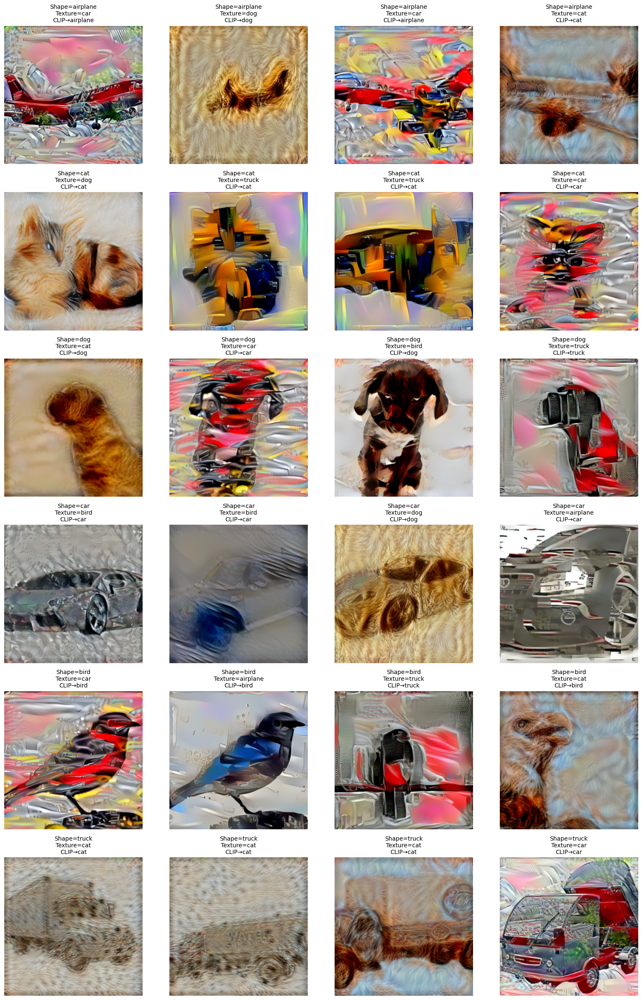

In [79]:
visualize_cue_conflict_predictions(
    cue_dataset,
    classes_to_show=["airplane", "cat", "dog", "car", "bird", "truck"],
    samples_per_class=4
)

## 6. Robustness Tests

In [84]:
def comprehensive_robustness_analysis():
    """Test CLIP's robustness to various perturbations with detailed analysis"""
    print(f"\n{'='*60}")
    print("COMPREHENSIVE ROBUSTNESS ANALYSIS")
    print(f"{'='*60}")

    # Define perturbations with varying severity levels
    perturbations = {
        'gaussian_noise': {
            'light': lambda x: torch.clamp(x + torch.randn_like(x) * 0.05, 0, 1),
            'medium': lambda x: torch.clamp(x + torch.randn_like(x) * 0.1, 0, 1),
            'heavy': lambda x: torch.clamp(x + torch.randn_like(x) * 0.2, 0, 1)
        },
        'gaussian_blur': {
            'light': lambda x: T.GaussianBlur(kernel_size=3, sigma=0.5)(x),
            'medium': lambda x: T.GaussianBlur(kernel_size=5, sigma=1.0)(x),
            'heavy': lambda x: T.GaussianBlur(kernel_size=7, sigma=2.0)(x)
        },
        'brightness': {
            'light': lambda x: T.functional.adjust_brightness(x, 0.7),
            'medium': lambda x: T.functional.adjust_brightness(x, 0.5),
            'heavy': lambda x: T.functional.adjust_brightness(x, 0.3)
        },
        'contrast': {
            'light': lambda x: T.functional.adjust_contrast(x, 0.7),
            'medium': lambda x: T.functional.adjust_contrast(x, 0.5),
            'heavy': lambda x: T.functional.adjust_contrast(x, 0.3)
        },
        'saturation': {
            'light': lambda x: T.functional.adjust_saturation(x, 0.5),
            'medium': lambda x: T.functional.adjust_saturation(x, 0.2),
            'heavy': lambda x: T.functional.adjust_saturation(x, 0.0)  # Grayscale
        }
    }

    # Get baseline test samples (20 per class)
    baseline_samples = []
    samples_per_class = 20

    for class_idx in range(10):
        class_count = 0
        for idx, (img, label) in enumerate(stl10_test):
            if label == class_idx and class_count < samples_per_class:
                baseline_samples.append((img, label, class_idx, idx))
                class_count += 1
            if class_count >= samples_per_class:
                break

    print(f"Testing robustness on {len(baseline_samples)} baseline samples")

    # Standard prompts
    standard_prompts = [f"a photo of a {cls}" for cls in stl10_classes]
    text_inputs = processor(text=standard_prompts, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        text_embeddings = model.get_text_features(**text_inputs)
    text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

    # Test baseline performance first
    baseline_results = test_samples_batch(baseline_samples, lambda x: x, text_embeddings, "baseline")
    baseline_accuracy = baseline_results['accuracy']
    baseline_per_class = baseline_results['per_class']
    print("\nBaseline (clean) performance:", baseline_accuracy)

    # Test each perturbation
    robustness_results = {'baseline': baseline_results}

    for perturbation_name, severity_levels in perturbations.items():
        print(f"\n--- TESTING {perturbation_name.upper()} ROBUSTNESS ---")

        for severity, transform_func in severity_levels.items():
            print(f"\n{severity.upper()} {perturbation_name}:")

            try:
                results = test_samples_batch(baseline_samples, transform_func, text_embeddings, f"{perturbation_name}_{severity}")
                robustness_results[f"{perturbation_name}_{severity}"] = results

                # Calculate robustness metrics
                accuracy_drop = baseline_accuracy - results['accuracy']
                relative_drop = (accuracy_drop / baseline_accuracy) * 100

                print(f"  Accuracy: {results['accuracy']*100:.1f}% (drop: {accuracy_drop*100:.1f}pp, {relative_drop:.1f}%)")

                # Find most affected classes
                worst_affected = []
                for class_idx in range(10):
                    if class_idx in baseline_per_class and class_idx in results['per_class']:
                        baseline_class_acc = baseline_per_class[class_idx]
                        perturbed_class_acc = results['per_class'][class_idx]
                        class_drop = baseline_class_acc - perturbed_class_acc
                        if class_drop > 0.2:  # More than 20% drop
                            worst_affected.append((stl10_classes[class_idx], class_drop))

                if worst_affected:
                    worst_affected.sort(key=lambda x: x[1], reverse=True)
                    print(f"  Most affected classes: {', '.join([f'{cls}(-{drop*100:.1f}%)' for cls, drop in worst_affected[:3]])}")

            except Exception as e:
                print(f"  Error with {severity} {perturbation_name}: {e}")

    # Robustness summary analysis
    print(f"\n{'='*50}")
    print("ROBUSTNESS SUMMARY ANALYSIS")
    print(f"{'='*50}")

    # Sort perturbations by impact
    perturbation_impacts = []
    for key, results in robustness_results.items():
        if key != 'baseline':
            impact = baseline_accuracy - results['accuracy']
            perturbation_impacts.append((key, impact, results['accuracy']))

    perturbation_impacts.sort(key=lambda x: x[1], reverse=True)

    print("Perturbations ranked by impact (accuracy drop):")
    for perturbation, impact, final_acc in perturbation_impacts:
        print(f"  {perturbation}: {final_acc*100:.1f}% (drop: {impact*100:.1f}pp)")

    # Robustness categories
    robust_perturbations = [p for p, impact, _ in perturbation_impacts if impact < 0.05]
    moderate_perturbations = [p for p, impact, _ in perturbation_impacts if 0.05 <= impact < 0.15]
    severe_perturbations = [p for p, impact, _ in perturbation_impacts if impact >= 0.15]

    print(f"\nRobustness Categories:")
    if robust_perturbations:
        print(f"  Highly robust to: {', '.join(robust_perturbations[:3])}")
    if moderate_perturbations:
        print(f"  Moderately affected by: {', '.join(moderate_perturbations[:3])}")
    if severe_perturbations:
        print(f"  Severely affected by: {', '.join(severe_perturbations[:3])}")

    # Compare with expected CNN behavior
    print(f"\nExpected vs Observed Robustness:")
    noise_impacts = [impact for p, impact, _ in perturbation_impacts if 'noise' in p]
    blur_impacts = [impact for p, impact, _ in perturbation_impacts if 'blur' in p]

    if noise_impacts:
        avg_noise_impact = np.mean(noise_impacts)
        print(f"  Average noise impact: {avg_noise_impact*100:.1f}pp")
        if avg_noise_impact < 0.1:
            print(f"    → CLIP shows good noise robustness")
        else:
            print(f"    → CLIP is sensitive to noise")

    if blur_impacts:
        avg_blur_impact = np.mean(blur_impacts)
        print(f"  Average blur impact: {avg_blur_impact*100:.1f}pp")
        if avg_blur_impact < 0.15:
            print(f"    → CLIP shows good blur robustness")
        else:
            print(f"    → CLIP is sensitive to blur")

    return robustness_results

def test_samples_batch(samples, transform_func, text_embeddings, test_name):
    """Helper function to test a batch of samples with a transformation"""
    correct_total = 0
    per_class_correct = defaultdict(int)
    per_class_total = defaultdict(int)
    confidence_scores = []

    for img, true_label, class_idx, orig_idx in samples:
        try:
            # Apply transformation
            transformed_img = transform_func(img)
            img_batch = transformed_img.unsqueeze(0).to(device)

            # Get prediction
            with torch.no_grad():
                img_embedding = model.get_image_features(img_batch)
            img_embedding = img_embedding / img_embedding.norm(dim=-1, keepdim=True)

            similarities = (img_embedding @ text_embeddings.T).squeeze()
            predicted_idx = similarities.argmax().item()
            confidence = similarities.max().item()

            # Track results
            is_correct = predicted_idx == true_label
            if is_correct:
                correct_total += 1
                per_class_correct[class_idx] += 1

            per_class_total[class_idx] += 1
            confidence_scores.append(confidence)

        except Exception as e:
            print(f"    Error processing sample {orig_idx}: {e}")

    # Calculate metrics
    accuracy = correct_total / len(samples) if samples else 0
    per_class_accuracy = {cls: per_class_correct[cls]/per_class_total[cls] for cls in per_class_total if per_class_total[cls] > 0}
    avg_confidence = np.mean(confidence_scores) if confidence_scores else 0

    return {
        'accuracy': accuracy,
        'per_class': per_class_accuracy,
        'confidence': avg_confidence,
        'total_samples': len(samples)
    }

In [85]:
robustness_results = comprehensive_robustness_analysis()


COMPREHENSIVE ROBUSTNESS ANALYSIS
Testing robustness on 200 baseline samples

Baseline (clean) performance: 0.98

--- TESTING GAUSSIAN_NOISE ROBUSTNESS ---

LIGHT gaussian_noise:
  Accuracy: 74.0% (drop: 24.0pp, 24.5%)
  Most affected classes: monkey(-60.0%), cat(-50.0%), dog(-35.0%)

MEDIUM gaussian_noise:
  Accuracy: 73.5% (drop: 24.5pp, 25.0%)
  Most affected classes: monkey(-50.0%), dog(-40.0%), cat(-35.0%)

HEAVY gaussian_noise:
  Accuracy: 67.5% (drop: 30.5pp, 31.1%)
  Most affected classes: monkey(-75.0%), cat(-45.0%), bird(-35.0%)

--- TESTING GAUSSIAN_BLUR ROBUSTNESS ---

LIGHT gaussian_blur:
  Accuracy: 97.5% (drop: 0.5pp, 0.5%)

MEDIUM gaussian_blur:
  Accuracy: 97.5% (drop: 0.5pp, 0.5%)

HEAVY gaussian_blur:
  Accuracy: 92.5% (drop: 5.5pp, 5.6%)

--- TESTING BRIGHTNESS ROBUSTNESS ---

LIGHT brightness:
  Accuracy: 73.5% (drop: 24.5pp, 25.0%)
  Most affected classes: monkey(-70.0%), cat(-55.0%)

MEDIUM brightness:
  Accuracy: 68.5% (drop: 29.5pp, 30.1%)
  Most affected clas

In [88]:
import warnings
warnings.filterwarnings("ignore")

In [92]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# 1. Test function for CLIP or ResNet
def test_samples_batch(samples, transform_func, model, text_embeddings=None, test_name=""):
    correct_total = 0
    per_class_correct = defaultdict(int)
    per_class_total = defaultdict(int)
    confidence_scores = []

    for img, true_label, class_idx, orig_idx in samples:
        try:
            transformed_img = transform_func(img)
            img_batch = transformed_img.unsqueeze(0).to(device)

            with torch.no_grad():
                if text_embeddings is not None:  # CLIP branch
                    img_embedding = model.get_image_features(img_batch)
                    img_embedding = img_embedding / img_embedding.norm(dim=-1, keepdim=True)
                    sims = (img_embedding @ text_embeddings.T).squeeze()
                    predicted_idx = sims.argmax().item()
                    confidence = sims.max().item()
                else:  # ResNet branch
                    logits = model(img_batch)
                    probs = torch.softmax(logits, dim=-1)
                    predicted_idx = probs.argmax().item()
                    confidence = probs.max().item()

            if predicted_idx == true_label:
                correct_total += 1
                per_class_correct[class_idx] += 1

            per_class_total[class_idx] += 1
            confidence_scores.append(confidence)

        except Exception as e:
            print(f"    Error processing sample {orig_idx}: {e}")

    accuracy = correct_total / len(samples) if samples else 0
    per_class_accuracy = {
        cls: per_class_correct[cls]/per_class_total[cls]
        for cls in per_class_total if per_class_total[cls] > 0
    }
    avg_confidence = np.mean(confidence_scores) if confidence_scores else 0

    return {
        'accuracy': accuracy,
        'per_class': per_class_accuracy,
        'confidence': avg_confidence,
        'total_samples': len(samples)
    }

# 2. Compare CLIP vs ResNet
def compare_clip_resnet(clip_model, resnet_model, baseline_samples, text_embeddings, perturbations):
    results = {"CLIP": {}, "ResNet": {}}

    # Baseline
    print("\nRunning baseline...")
    results["CLIP"]["baseline"] = test_samples_batch(baseline_samples, lambda x: x, clip_model, text_embeddings, "baseline")
    results["ResNet"]["baseline"] = test_samples_batch(baseline_samples, lambda x: x, resnet_model, None, "baseline")

    # Perturbations
    for pert_name, levels in perturbations.items():
        for severity, transform_func in levels.items():
            tag = f"{pert_name}_{severity}"
            print(f"\nTesting {tag}...")
            results["CLIP"][tag] = test_samples_batch(baseline_samples, transform_func, clip_model, text_embeddings, tag)
            results["ResNet"][tag] = test_samples_batch(baseline_samples, transform_func, resnet_model, None, tag)

    return results

# 3. Visualization: CLIP vs ResNet predictions
def visualize_predictions(samples, transform_func, text_embeddings, clip_model, resnet_model, device, stl10_classes, num_images=5):
    """
    Visualize original vs perturbed images with CLIP and ResNet predictions.
    """
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 4 * num_images))

    for idx in range(num_images):
        img, true_label, _, _ = samples[idx]

        # --- Original image ---
        orig_batch = img.unsqueeze(0).to(device)

        with torch.no_grad():
            clip_orig = clip_model.get_image_features(orig_batch)
        clip_orig = clip_orig / clip_orig.norm(dim=-1, keepdim=True)
        sim_orig = (clip_orig @ text_embeddings.T).squeeze()
        clip_pred_orig = stl10_classes[sim_orig.argmax().item()]

        resnet_pred_orig = stl10_classes[resnet_model(orig_batch).argmax(1).item()]

        # --- Perturbed image ---
        pert_img = transform_func(img)
        pert_batch = pert_img.unsqueeze(0).to(device)

        with torch.no_grad():
            clip_pert = clip_model.get_image_features(pert_batch)
        clip_pert = clip_pert / clip_pert.norm(dim=-1, keepdim=True)
        sim_pert = (clip_pert @ text_embeddings.T).squeeze()
        clip_pred_pert = stl10_classes[sim_pert.argmax().item()]

        resnet_pred_pert = stl10_classes[resnet_model(pert_batch).argmax(1).item()]

        # --- Plot original ---
        axes[idx, 0].imshow(img.permute(1, 2, 0).cpu())
        axes[idx, 0].set_title(f"Original\nCLIP: {clip_pred_orig}\nResNet: {resnet_pred_orig}")
        axes[idx, 0].axis("off")

        # --- Plot perturbed ---
        axes[idx, 1].imshow(pert_img.permute(1, 2, 0).cpu())
        axes[idx, 1].set_title(f"Perturbed\nCLIP: {clip_pred_pert}\nResNet: {resnet_pred_pert}")
        axes[idx, 1].axis("off")

    plt.tight_layout()
    plt.show()

In [93]:
perturbations = {
    'gaussian_noise': {
        'light': lambda x: torch.clamp(x + torch.randn_like(x) * 0.05, 0, 1),
        'medium': lambda x: torch.clamp(x + torch.randn_like(x) * 0.1, 0, 1),
        'heavy': lambda x: torch.clamp(x + torch.randn_like(x) * 0.2, 0, 1)
    },
    'gaussian_blur': {
        'light': lambda x: T.GaussianBlur(kernel_size=3, sigma=0.5)(x),
        'medium': lambda x: T.GaussianBlur(kernel_size=5, sigma=1.0)(x),
        'heavy': lambda x: T.GaussianBlur(kernel_size=7, sigma=2.0)(x)
    },
    'brightness': {
            'light': lambda x: T.functional.adjust_brightness(x, 0.7),
            'medium': lambda x: T.functional.adjust_brightness(x, 0.5),
            'heavy': lambda x: T.functional.adjust_brightness(x, 0.3)
    },
    'contrast': {
        'light': lambda x: T.functional.adjust_contrast(x, 0.7),
        'medium': lambda x: T.functional.adjust_contrast(x, 0.5),
        'heavy': lambda x: T.functional.adjust_contrast(x, 0.3)
    },
    'saturation': {
        'light': lambda x: T.functional.adjust_saturation(x, 0.5),
        'medium': lambda x: T.functional.adjust_saturation(x, 0.2),
        'heavy': lambda x: T.functional.adjust_saturation(x, 0.0)  # Grayscale
    }
}

# Prepare baseline samples (e.g. 20 per class)
baseline_samples = []
samples_per_class = 20
for class_idx in range(10):
    class_count = 0
    for idx, (img, label) in enumerate(stl10_test):
        if label == class_idx and class_count < samples_per_class:
            baseline_samples.append((img, label, class_idx, idx))
            class_count += 1
        if class_count >= samples_per_class:
            break

In [94]:
# Prepare text embeddings for CLIP
resnet_model , supervised_feature_extractor = load_finetuned_resnet("/content/resnet50_weights.pth", device)

standard_prompts = [f"a photo of a {cls}" for cls in stl10_classes]
text_inputs = processor(text=standard_prompts, return_tensors="pt", padding=True).to(device)
with torch.no_grad():
    text_embeddings = model.get_text_features(**text_inputs)
text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

In [95]:
# Run comparison
robustness_results = compare_clip_resnet(model, resnet_model, baseline_samples, text_embeddings, perturbations)


Running baseline...

Testing gaussian_noise_light...

Testing gaussian_noise_medium...

Testing gaussian_noise_heavy...

Testing gaussian_blur_light...

Testing gaussian_blur_medium...

Testing gaussian_blur_heavy...

Testing brightness_light...

Testing brightness_medium...

Testing brightness_heavy...

Testing contrast_light...

Testing contrast_medium...

Testing contrast_heavy...

Testing saturation_light...

Testing saturation_medium...

Testing saturation_heavy...


In [102]:
def visualize_all_predictions(samples, perturbations, text_embeddings, clip_model, resnet_model, device, stl10_classes, num_images_per_perturb=5):
    """
    Loop over all perturbations and severities, visualize predictions for a few examples.
    """
    for perturb_name, severities in perturbations.items():
        for severity, transform_func in severities.items():
            print(f"\n=== Visualizing {perturb_name} ({severity}) ===")
            visualize_predictions(
                samples=samples,
                transform_func=transform_func,
                text_embeddings=text_embeddings,
                clip_model=clip_model,
                resnet_model=resnet_model,
                device=device,
                stl10_classes=stl10_classes,
                num_images=num_images_per_perturb
            )

In [ ]:
# Visualize predictions (5 examples)
visualize_all_predictions(baseline_samples, perturbations, text_embeddings, model, resnet_model, device, stl10_classes)